# Templete Mating 

In [1]:
# Import libraries.
import numpy as np
import matplotlib.pyplot as plt
import cv2
from matplotlib import cm

(1367, 1025, 3)


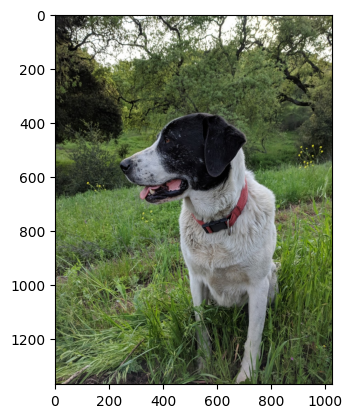

In [2]:
full = cv2.imread("sammy.jpg")
full = cv2.cvtColor(full, cv2.COLOR_BGR2RGB)
plt.imshow(full)
print(full.shape)

(375, 486, 3)


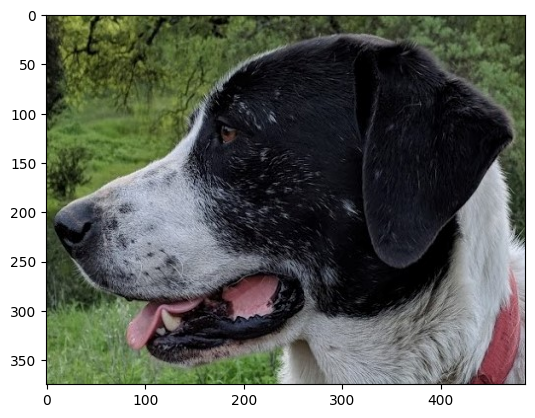

In [3]:
face = cv2.imread("sammy_face.jpg")
face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
plt.imshow(face)
print(face.shape)

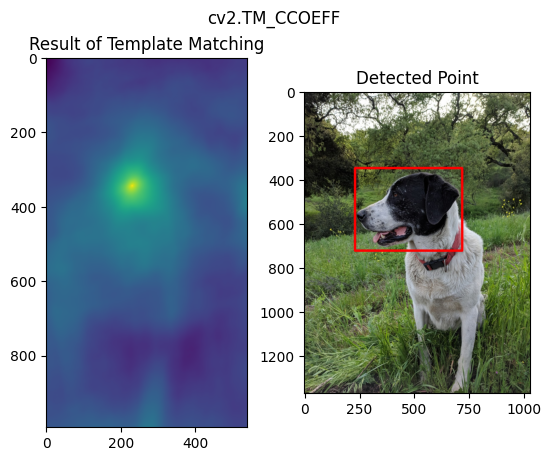

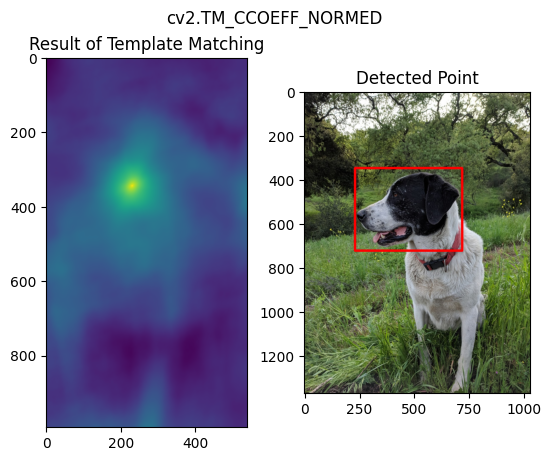

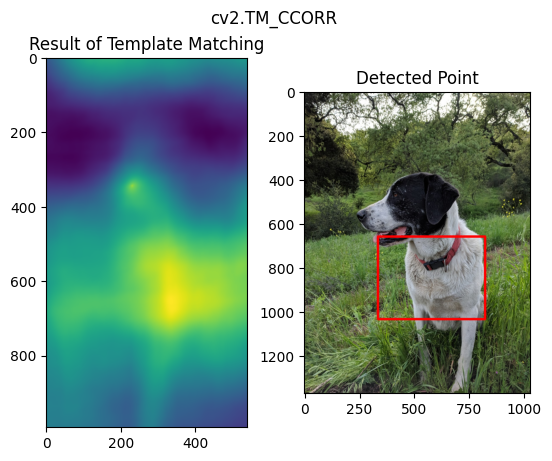

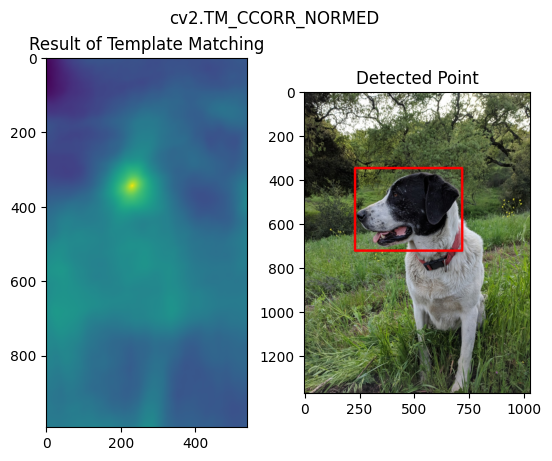

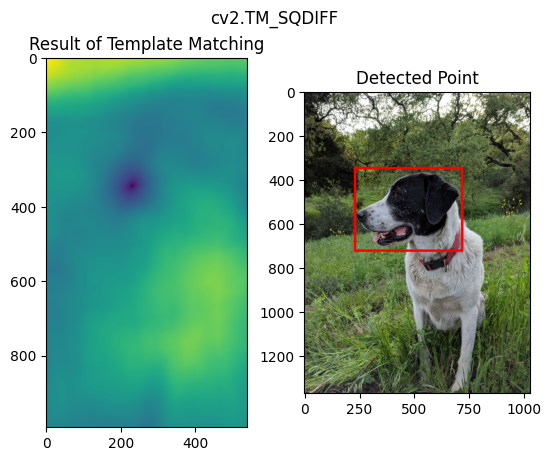

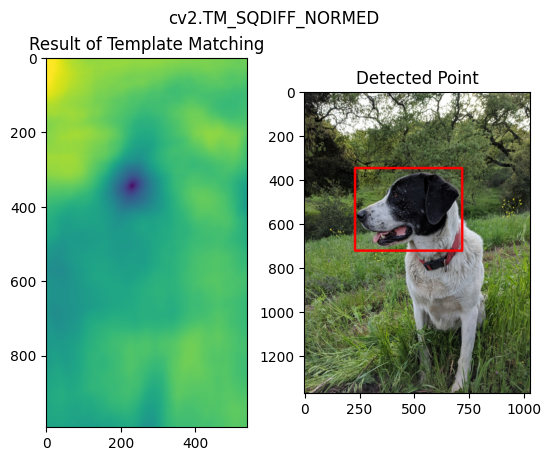

In [4]:
# All the 6 methods for comparison in a list
# Note how we are using strings, later on we'll use the eval() function to convert to function
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']
height, width,channels = face.shape
for m in methods:
    
    # Create a copy of the image
    full_copy = full.copy()
    
    # Get the actual function instead of the string
    method = eval(m)

    # Apply template Matching with the method
    res = cv2.matchTemplate(full_copy,face,method)
    
    # Grab the Max and Min values, plus their locations
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    
    # Set up drawing of Rectangle
    
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    # Notice the coloring on the last 2 left hand side images.
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc    
    else:
        top_left = max_loc
        
    # Assign the Bottom Right of the rectangle
    bottom_right = (top_left[0] + width, top_left[1] + height)

    # Draw the Red Rectangle
    cv2.rectangle(full_copy,top_left, bottom_right, 255, 10)

    # Plot the Images
    plt.subplot(121)
    plt.imshow(res)
    plt.title('Result of Template Matching')
    
    plt.subplot(122)
    plt.imshow(full_copy)
    plt.title('Detected Point')
    plt.suptitle(m)
    
    
    plt.show()
    print('\n')
    print('\n')
    

# Corner detection
**cornerHarris Function**

*  src Input single-channel 8-bit or floating-point image.
*  dst Image to store the Harris detector responses. It has the type CV_32FC1 and the same size as src .
*  blockSize Neighborhood size (see the details on #cornerEigenValsAndVecs ).
*  ksize Aperture parameter for the Sobel operator.
*  k Harris detector free parameter. See the formula in DocString
*  borderType Pixel extrapolation method. See #BorderTypes.

(352, 352, 3)


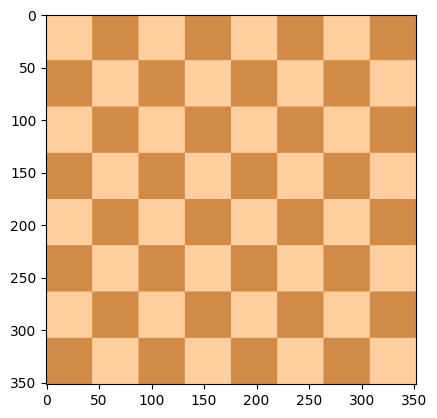

In [5]:
flat_chess = cv2.imread("flat_chessboard.png")
flat_chess = cv2.cvtColor(flat_chess, cv2.COLOR_BGR2RGB)
plt.imshow(flat_chess)
print(flat_chess.shape)

(352, 352)


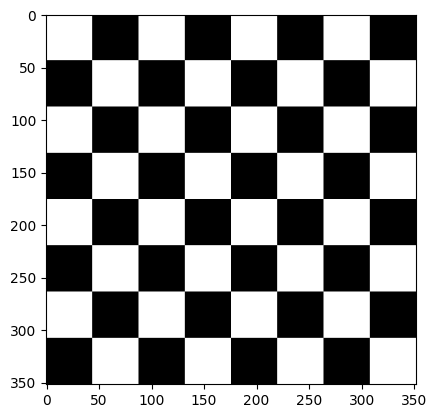

In [6]:
gray_flat_chess = cv2.cvtColor(flat_chess, cv2.COLOR_RGB2GRAY)
plt.imshow(gray_flat_chess,cmap='gray')
print(gray_flat_chess.shape)

(390, 600, 3)


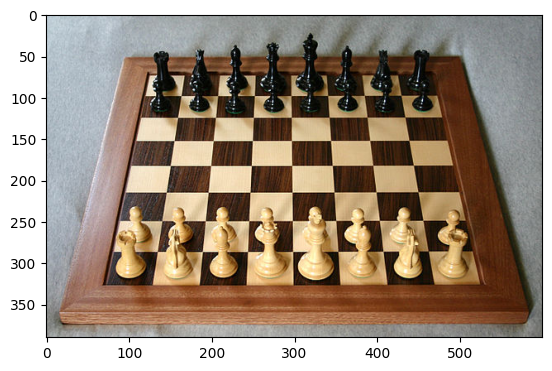

In [7]:
real_chess = cv2.imread("real_chessboard.jpg")
real_chesss = cv2.cvtColor(real_chess, cv2.COLOR_BGR2RGB)
plt.imshow(real_chesss)
print(real_chess.shape)

(390, 600)


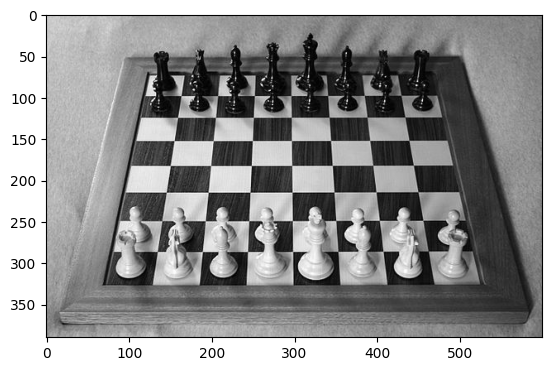

In [8]:
real_chess = cv2.imread("real_chessboard.jpg")
grey_real_chess = cv2.cvtColor(real_chess, cv2.COLOR_BGR2GRAY)
plt.imshow(grey_real_chess,cmap="grey")
print(grey_real_chess.shape)

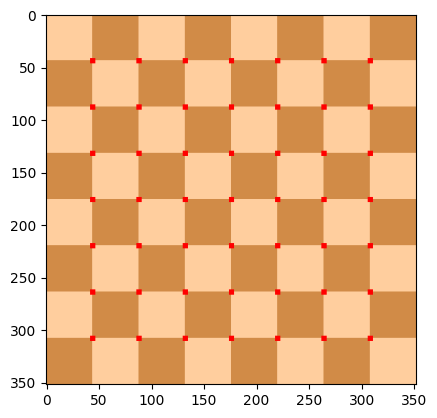

In [9]:
# Convert Gray Scale Image to Float Values
gray = np.float32(gray_flat_chess)

# Corner Harris Detection
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

# result is dilated for marking the corners, not important to actual corner detection
# this is just so we can plot out the points on the image shown
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
flat_chess[dst>0.01*dst.max()]=[255,0,0]

plt.imshow(flat_chess)

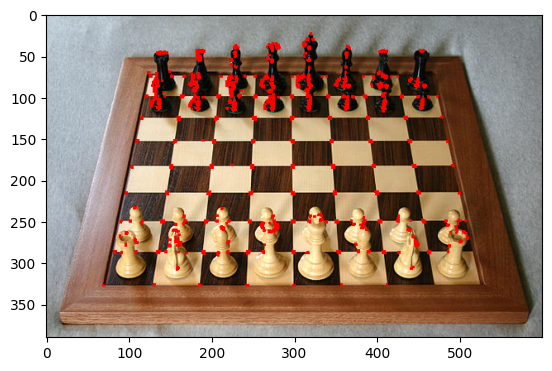

In [10]:
# Convert Gray Scale Image to Float Values
gray = np.float32(grey_real_chess)

# Corner Harris Detection
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

# result is dilated for marking the corners, not important to actual corner detection
# this is just so we can plot out the points on the image shown
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
real_chesss[dst>0.01*dst.max()]=[255,0,0]

plt.imshow(real_chesss)

-----

## Shi-Tomasi Corner Detector & Good Features to Track Paper

[Link to Paper from Video](http://www.ai.mit.edu/courses/6.891/handouts/shi94good.pdf)

goodFeatureToTrack Function Parameters

* image Input 8-bit or floating-point 32-bit, single-channel image.
* corners Output vector of detected corners.
* maxCorners Maximum number of corners to return. If there are more corners than are found,the strongest of them is returned. `maxCorners <= 0` implies that no limit on the maximum is set and all detected corners are returned.
* qualityLevel Parameter characterizing the minimal accepted quality of image corners. The parameter value is multiplied by the best corner quality measure, which is the minimal eigenvalue (see #cornerMinEigenVal ) or the Harris function response (see #cornerHarris ). The corners with the quality measure less than the product are rejected. For example, if the best corner has the quality measure = 1500, and the qualityLevel=0.01 , then all the corners with the quality measure less than 15 are rejected.

In [11]:
# Need to reset the images since we drew on them
flat_chess = cv2.imread('flat_chessboard.png')
flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2RGB)
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)

C:\Users\HP B.DESKTOP-20RBB06\AppData\Local\Temp\ipykernel_2428\784026469.py:2: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


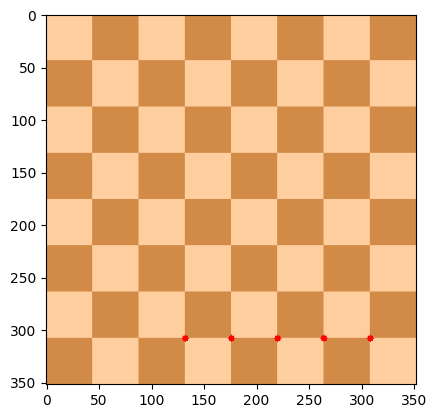

In [12]:
corners = cv2.goodFeaturesToTrack(gray_flat_chess,5,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(flat_chess,(x,y),3,255,-1)

plt.imshow(flat_chess)

C:\Users\HP B.DESKTOP-20RBB06\AppData\Local\Temp\ipykernel_2428\1148112571.py:2: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


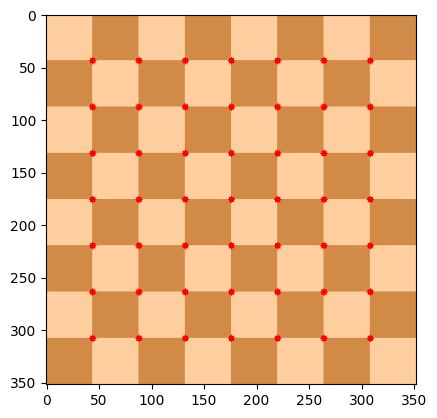

In [13]:
corners = cv2.goodFeaturesToTrack(gray_flat_chess,64,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(flat_chess,(x,y),3,255,-1)

plt.imshow(flat_chess)

In [14]:
real_chess = cv2.imread('real_chessboard.jpg')
real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2RGB)
gray_real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)

C:\Users\HP B.DESKTOP-20RBB06\AppData\Local\Temp\ipykernel_2428\1649863848.py:2: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


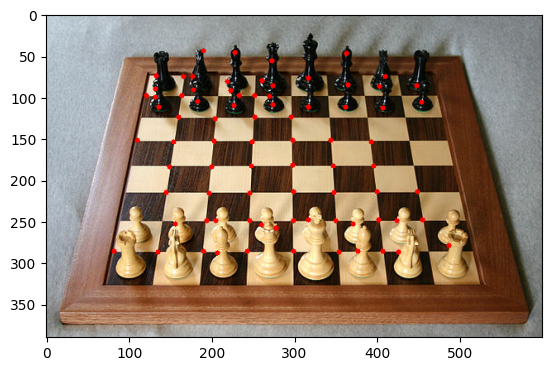

In [15]:
corners = cv2.goodFeaturesToTrack(gray_real_chess,80,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(real_chess,(x,y),3,255,-1)

plt.imshow(real_chess)

# Edge detection

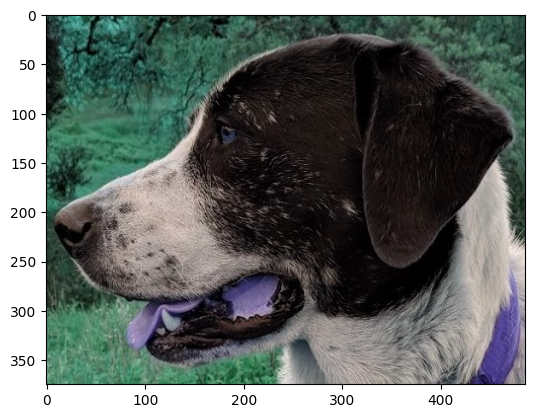

In [16]:
img_edge = cv2.imread('sammy_face.jpg')
plt.imshow(img_edge)

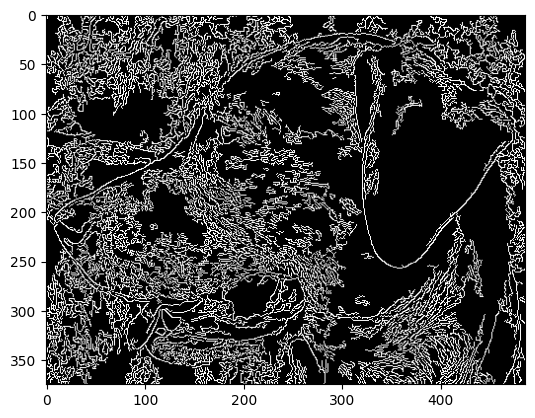

In [17]:
edges = cv2.Canny(image=img_edge , threshold1=0, threshold2=255)
plt.imshow(edges,cmap="grey")

## Choosing Thresholds

https://stackoverflow.com/questions/25125670/best-value-for-threshold-in-canny

In [18]:
# Calculate the median pixel value
med_val = np.median(edges) 
# Lower bound is either 0 or 70% of the median value, whicever is higher
lower = int(max(0, 0.7* med_val))
# Upper bound is either 255 or 30% above the median value, whichever is lower
upper = int(min(255,1.3 * med_val))

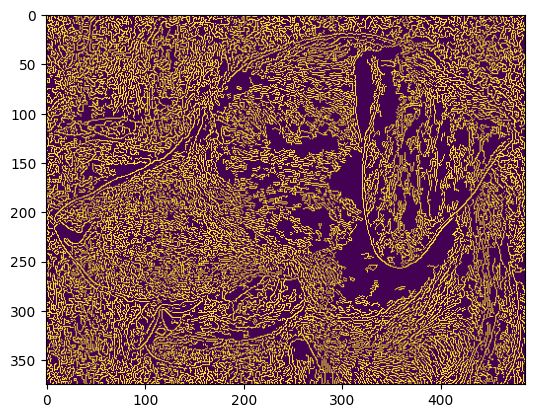

In [19]:
edges = cv2.Canny(image=img_edge, threshold1=lower , threshold2=upper+100)
plt.imshow(edges)

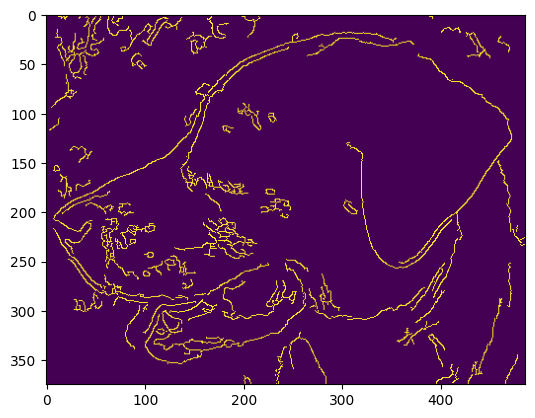

In [20]:
blurred_img = cv2.blur(img_edge,ksize=(5,5))
edges = cv2.Canny(image=blurred_img, threshold1=lower , threshold2=upper+150)
plt.imshow(edges)

# Grid Detection

In [21]:
flat_chess = cv2.imread('flat_chessboard.png')

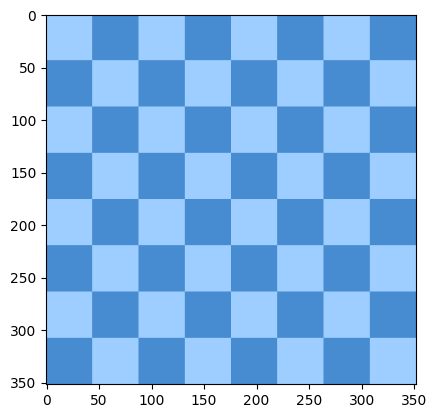

In [22]:
plt.imshow(flat_chess,cmap='gray')

In [23]:
found, corners = cv2.findChessboardCorners(flat_chess,(7,7))

In [24]:
if found:
    print('OpenCV was able to find the corners')
else:
    print("OpenCV did not find corners. Double check your patternSize.")

OpenCV was able to find the corners


In [25]:
corners.shape

(49, 1, 2)

In [26]:
flat_chess_copy = flat_chess.copy()
cv2.drawChessboardCorners(flat_chess_copy, (7, 7), corners, found)

array([[[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       [[158, 206, 255],
        [158, 206, 255],
        [158, 206, 255],
        ...,
        [ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209]],

       ...,

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]],

       [[ 71, 139, 209],
        [ 71, 139, 209],
        [ 71, 139, 209],
        ...,
        [158, 206, 255],
        [158, 206, 255],
        [158, 206, 255]]

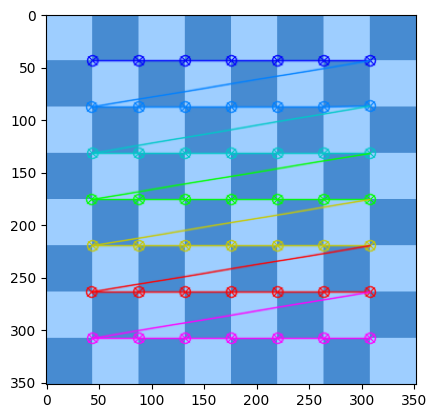

In [27]:
plt.imshow(flat_chess_copy)

# Circle Based Grids

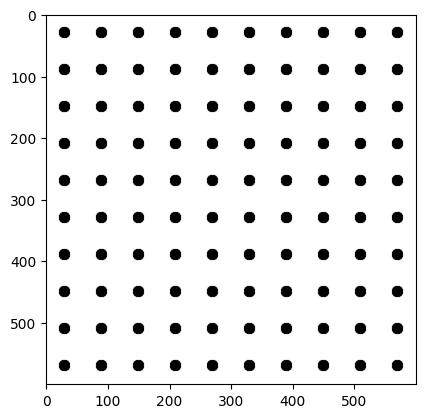

In [28]:
dots = cv2.imread('dot_grid.png')
plt.imshow(dots)

In [29]:
found, corners = cv2.findCirclesGrid(dots, (10,10), cv2.CALIB_CB_SYMMETRIC_GRID)

In [30]:
dbg_image_circles = dots.copy()
cv2.drawChessboardCorners(dbg_image_circles, (10, 10), corners, found)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

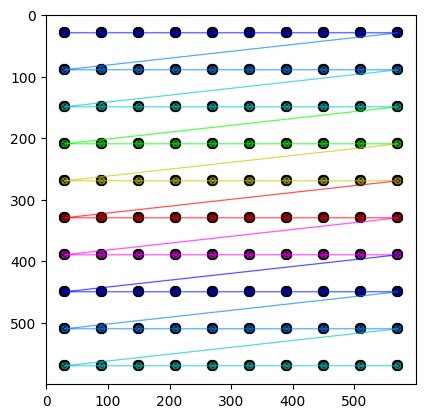

In [31]:
plt.imshow(dbg_image_circles)

## Contour Detection

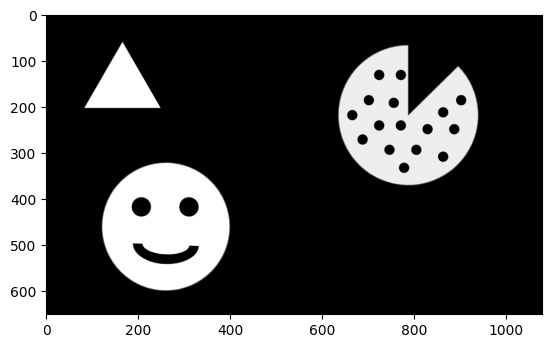

In [32]:
img = cv2.imread('internal_external.png',0)
img.shape
plt.imshow(img,cmap="grey")

**findContours**

function will return back contours in an image, and based on the RETR method called, you can get back external, internal, or both:

* cv2.RETR_EXTERNAL:Only extracts external contours
* cv2.RETR_CCOMP: Extracts both internal and external contours organized in a two-level hierarchy
* cv2.RETR_TREE: Extracts both internal and external contours organized in a  tree graph
* cv2.RETR_LIST: Extracts all contours without any internal/external relationship

In [33]:
image = img.copy()  # Create a copy of the input image
contours, hierarchy = cv2.findContours(img, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [34]:
type(contours)

tuple

In [35]:
len(contours)

22

In [36]:
type(hierarchy)

numpy.ndarray

In [37]:
hierarchy.shape

(1, 22, 4)

In [38]:
hierarchy

array([[[ 4, -1,  1, -1],
        [ 2, -1, -1,  0],
        [ 3,  1, -1,  0],
        [-1,  2, -1,  0],
        [21,  0,  5, -1],
        [ 6, -1, -1,  4],
        [ 7,  5, -1,  4],
        [ 8,  6, -1,  4],
        [ 9,  7, -1,  4],
        [10,  8, -1,  4],
        [11,  9, -1,  4],
        [12, 10, -1,  4],
        [13, 11, -1,  4],
        [14, 12, -1,  4],
        [15, 13, -1,  4],
        [16, 14, -1,  4],
        [17, 15, -1,  4],
        [18, 16, -1,  4],
        [19, 17, -1,  4],
        [20, 18, -1,  4],
        [-1, 19, -1,  4],
        [-1,  4, -1, -1]]], dtype=int32)

In [39]:
# Draw External Contours

# Set up empty array
external_contours = np.zeros(image.shape)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(external_contours, contours, i, 255, -1)

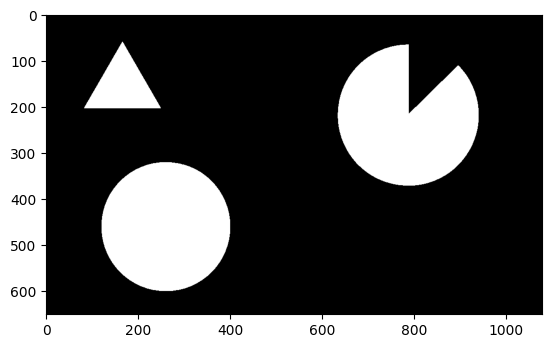

In [40]:
plt.imshow(external_contours,cmap='gray')

In [41]:
# Draw internal Contours

# Set up empty array
internal_contours = np.zeros(image.shape)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] != -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(internal_contours, contours, i, 255, -1)

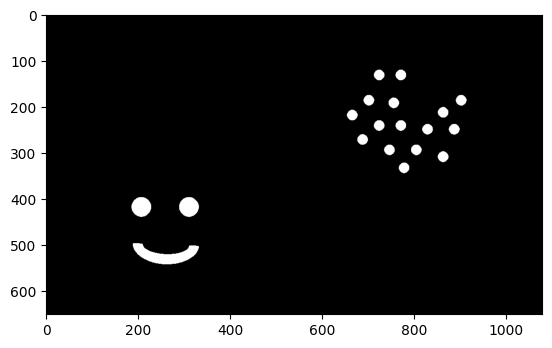

In [42]:
plt.imshow(internal_contours,cmap='gray')

In [43]:
# Draw internal Contours

# Set up empty array
internal_contours = np.zeros(image.shape)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == 0:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(internal_contours, contours, i, 255, -1)

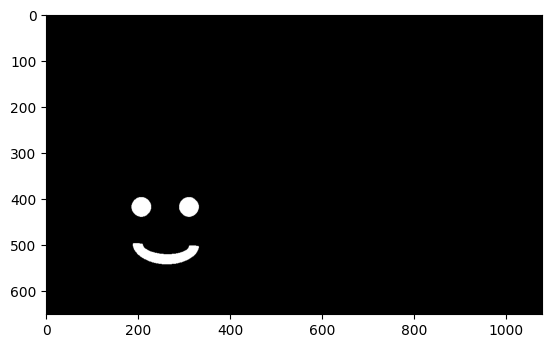

In [44]:
plt.imshow(internal_contours,cmap='gray')

# feature matching

In [3]:
def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

In [46]:
reeses = cv2.imread('reeses_puffs.png',0)   

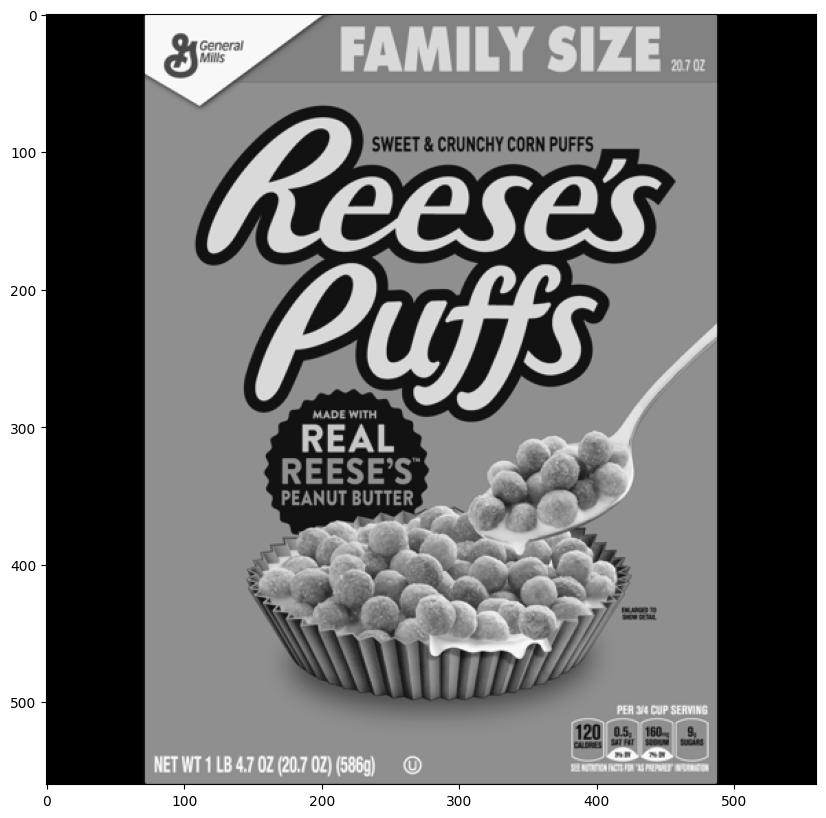

In [47]:
display(reeses)

In [48]:
cereals = cv2.imread('many_cereals.jpg',0)

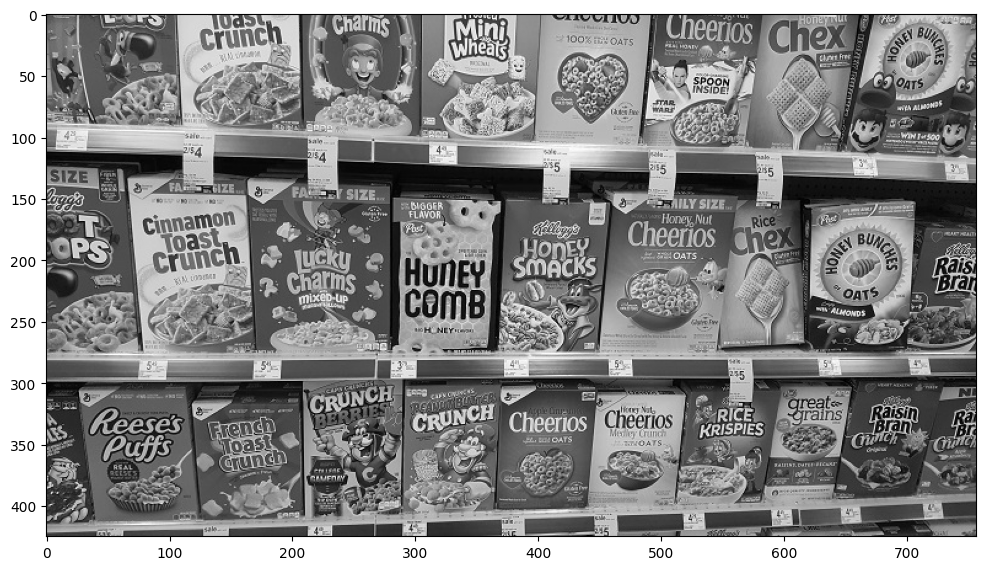

In [49]:
display(cereals)

--------
## Brute Force Detection with ORB Descriptors

In [50]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(reeses,None)
kp2, des2 = orb.detectAndCompute(cereals,None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)


In [51]:
matches

(< cv2.DMatch 0000026C6701E190>,
 < cv2.DMatch 0000026C681EACF0>,
 < cv2.DMatch 0000026C681E90D0>,
 < cv2.DMatch 0000026C681E8350>,
 < cv2.DMatch 0000026C681E9390>,
 < cv2.DMatch 0000026C681EBD10>,
 < cv2.DMatch 0000026C681EADB0>,
 < cv2.DMatch 0000026C681EAE50>,
 < cv2.DMatch 0000026C65F11110>,
 < cv2.DMatch 0000026C65F11230>,
 < cv2.DMatch 0000026C65F11010>,
 < cv2.DMatch 0000026C65F10B70>,
 < cv2.DMatch 0000026C65F10A30>,
 < cv2.DMatch 0000026C65F10910>,
 < cv2.DMatch 0000026C65F10590>,
 < cv2.DMatch 0000026C65F10810>,
 < cv2.DMatch 0000026C65F10AF0>,
 < cv2.DMatch 0000026C65F10710>,
 < cv2.DMatch 0000026C65F110F0>,
 < cv2.DMatch 0000026C65F10AD0>,
 < cv2.DMatch 0000026C65F10ED0>,
 < cv2.DMatch 0000026C65F10A70>,
 < cv2.DMatch 0000026C65F10550>,
 < cv2.DMatch 0000026C65F11190>,
 < cv2.DMatch 0000026C65F107D0>,
 < cv2.DMatch 0000026C65F104F0>,
 < cv2.DMatch 0000026C65F11070>,
 < cv2.DMatch 0000026C65F11210>,
 < cv2.DMatch 0000026C65F10EF0>,
 < cv2.DMatch 0000026C65F111F0>,
 < cv2.DMa

In [52]:
# each one in array has distance
print(matches[0].distance)

56.0


In [53]:
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 25 matches.
reeses_matches = cv2.drawMatches(reeses,kp1,cereals,kp2,matches[:15],None,flags=2)

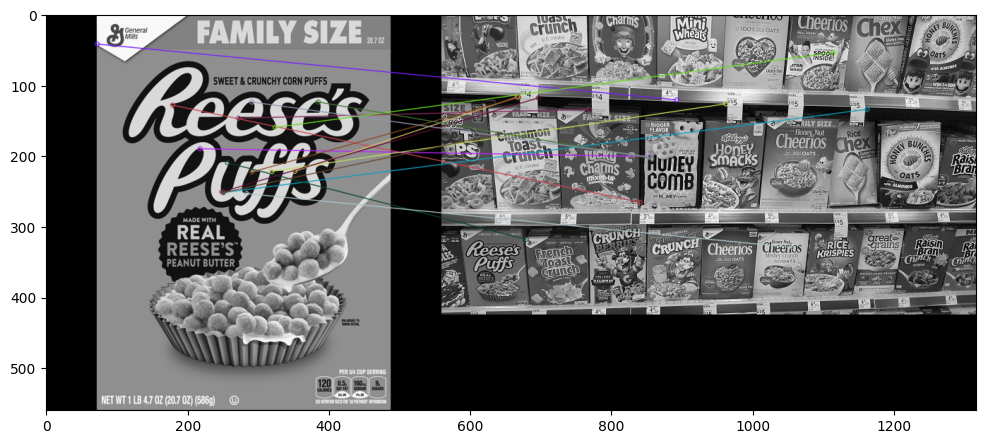

In [54]:
display(reeses_matches)

## Brute-Force Matching with SIFT Descriptors and Ratio Test

In [55]:
# Create SIFT Object
sift = cv2.SIFT_create()
#sift = cv2.xfeatures2d.SIFT_create() # the old version

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for match1,match2 in matches:
    if match1.distance < 0.75*match2.distance:
        good.append([match1])

# cv2.drawMatchesKnn expects list of lists as matches.
sift_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)

In [56]:
len(good)

79

In [57]:
len(matches)

1501

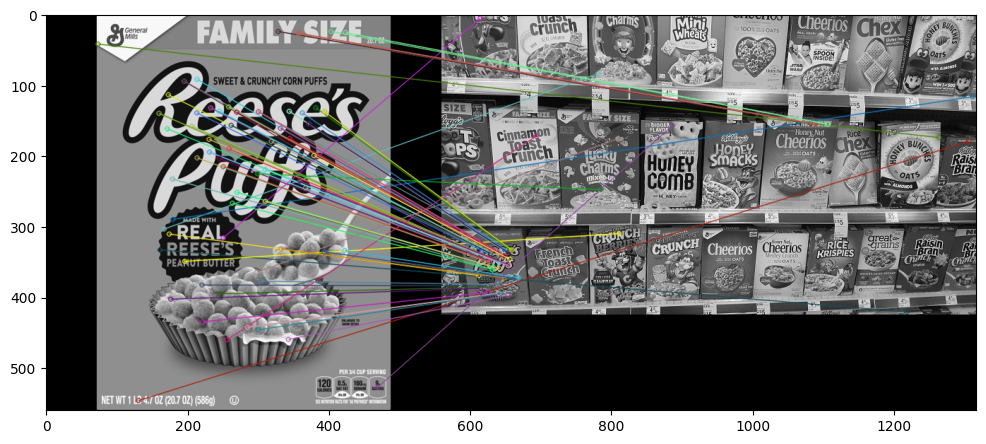

In [58]:
display(sift_matches)

## FLANN based Matcher

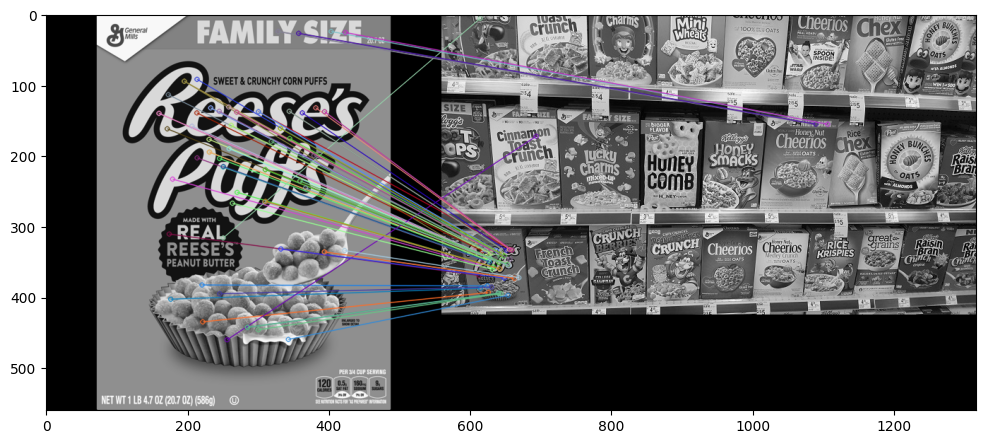

In [59]:
# Initiate SIFT detector
#sift = cv2.xfeatures2d.SIFT_create()
sift = cv2.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=100)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

good = []

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.7*match2.distance:
        
        good.append([match1])


flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)

display(flann_matches)

## Alternative code

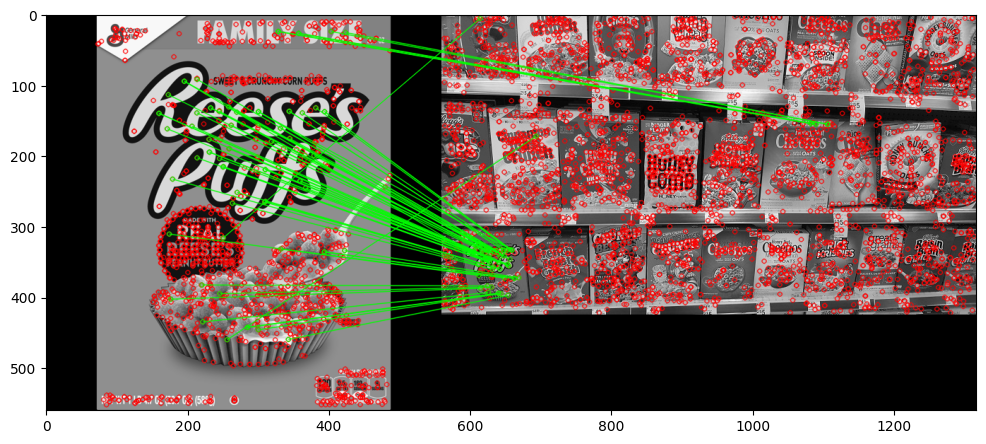

In [60]:
#sift = cv2.xfeatures2d.SIFT_create()
sift = cv2.SIFT_create()

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.7*match2.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 0)

flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,matches,None,**draw_params)

display(flann_matches)

# Image Segementation and the Watershed Algorithm

## Naive Approach

Let's try to simply use a threshold and then use findContours.

In [61]:
sep_coins = cv2.imread('pennies.jpg')

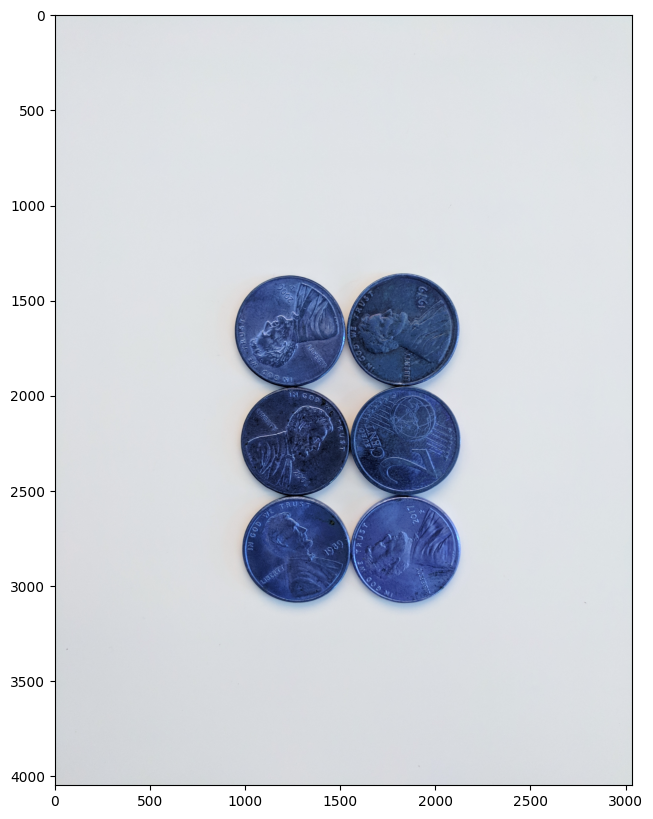

In [62]:
display(sep_coins)

### Apply Median Blurring

We have too much detail in this image, including light, the face edges on the coins, and too much detail in the background. Let's use Median Blur Filtering to blur the image a bit, which will be useful later on when we threshold.

In [63]:
sep_blur = cv2.medianBlur(sep_coins,25)

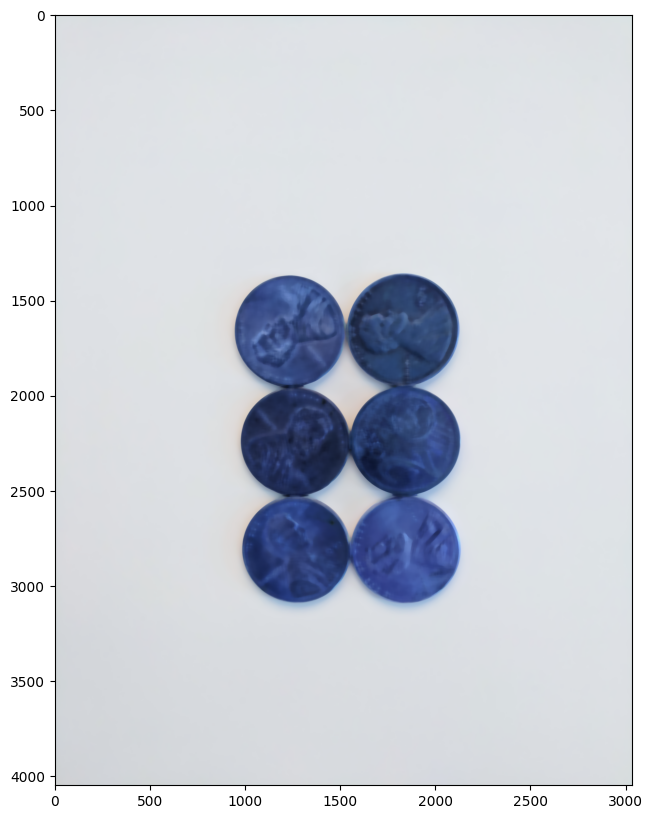

In [64]:
display(sep_blur)

## convert to scale gery

In [65]:
gray_sep_coins = cv2.cvtColor(sep_blur,cv2.COLOR_BGR2GRAY)

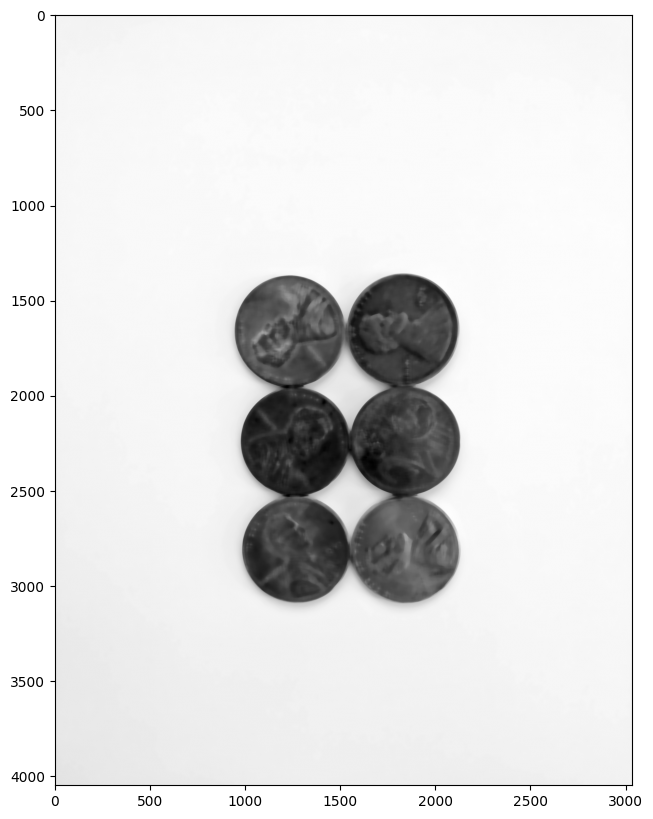

In [66]:
display(gray_sep_coins)

## Binary Threshold

In [67]:
ret, sep_thresh = cv2.threshold(gray_sep_coins,160,255,cv2.THRESH_BINARY_INV)

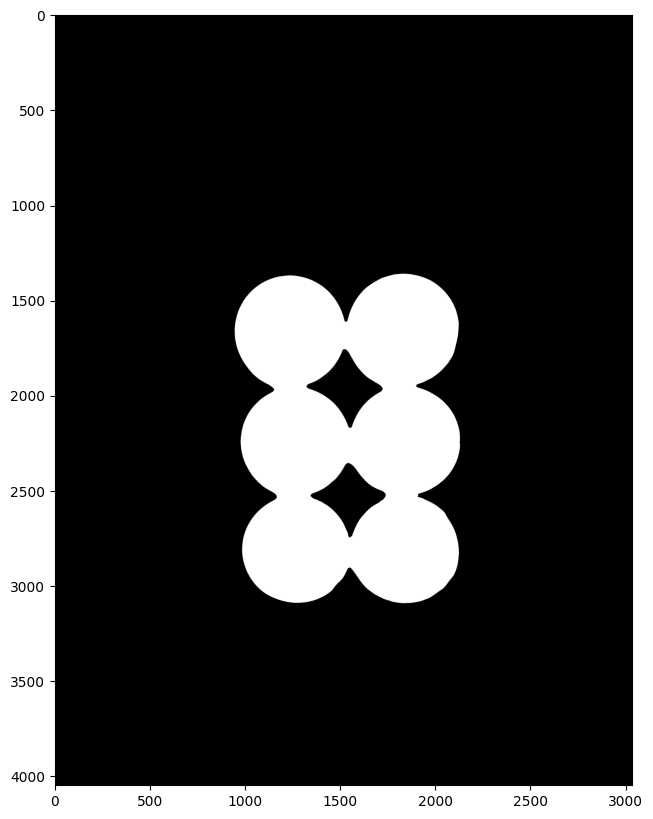

In [68]:
display(sep_thresh)

## FindContours

In [69]:
contours, hierarchy = cv2.findContours(sep_thresh.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [70]:
# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(sep_coins, contours, i, (255, 0, 0), 10)

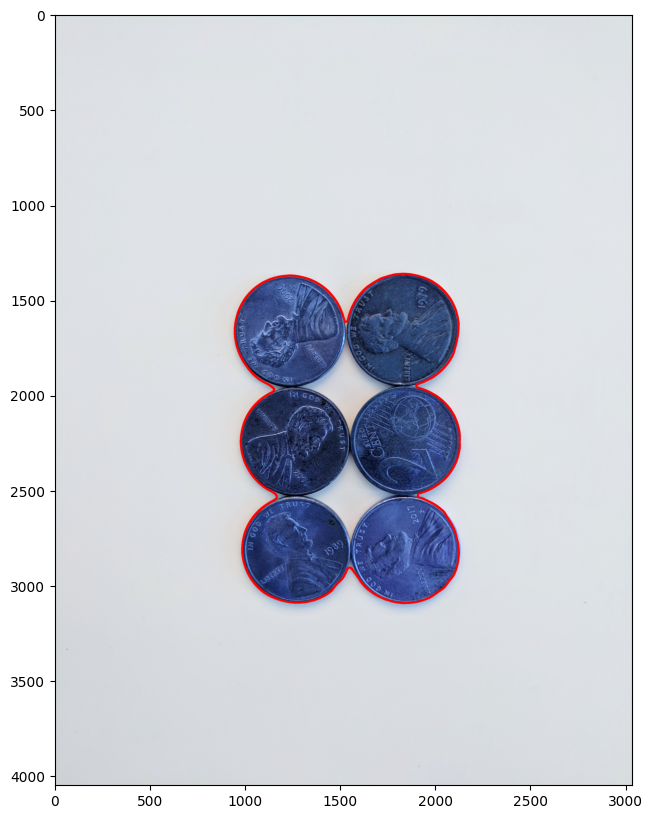

In [71]:
display(sep_coins)

# Watershed Algorithm

Let's now try the watershed algorithm apporach to draw contours around the pennies. Also make sure to watch the video to understand what the function calls are doing here.

In [72]:
img = cv2.imread('pennies.jpg')

In [73]:
img = cv2.medianBlur(img,35)

In [74]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [75]:
# Apply Threshold (Inverse Binary with OTSU as well)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

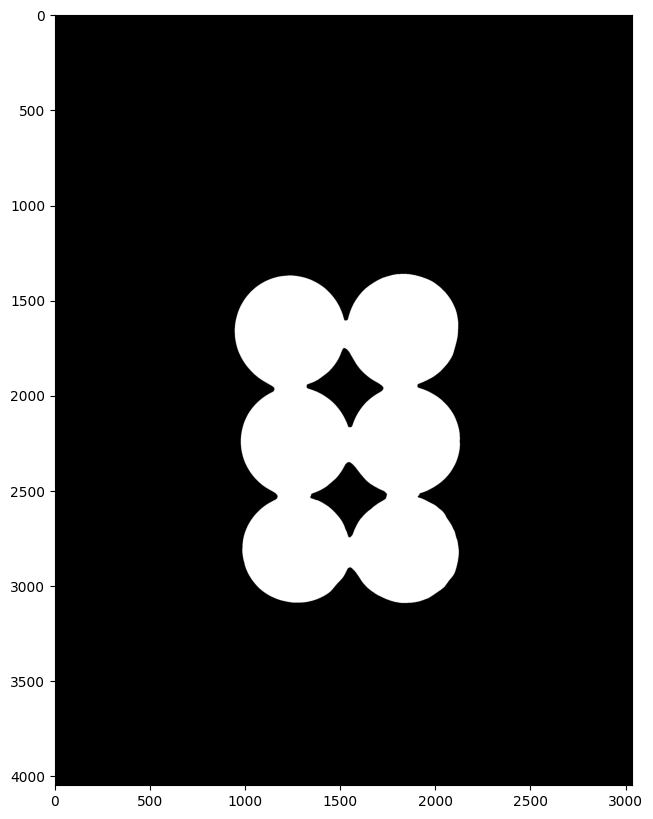

In [76]:
display(thresh)

In [77]:
# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)

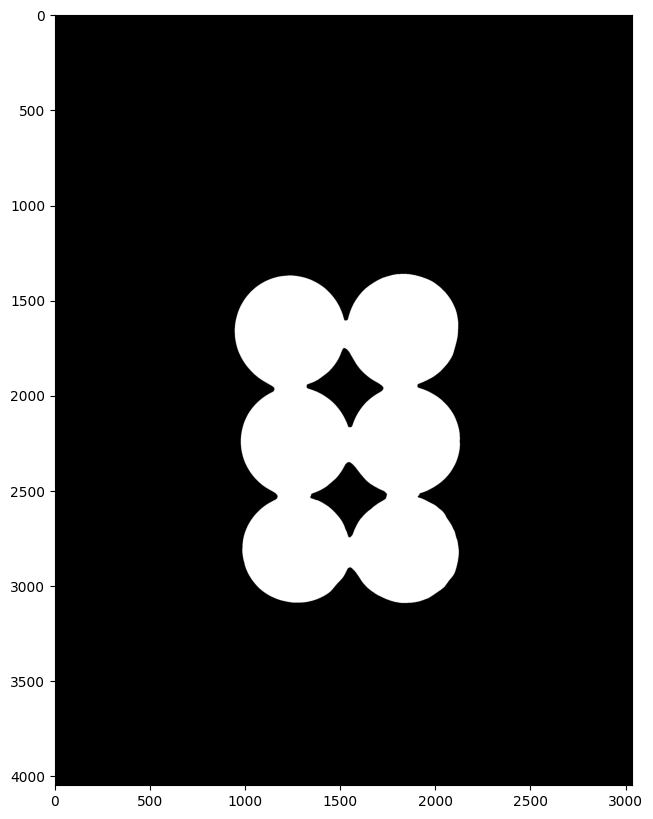

In [78]:
display(opening)

In [79]:
# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=3)

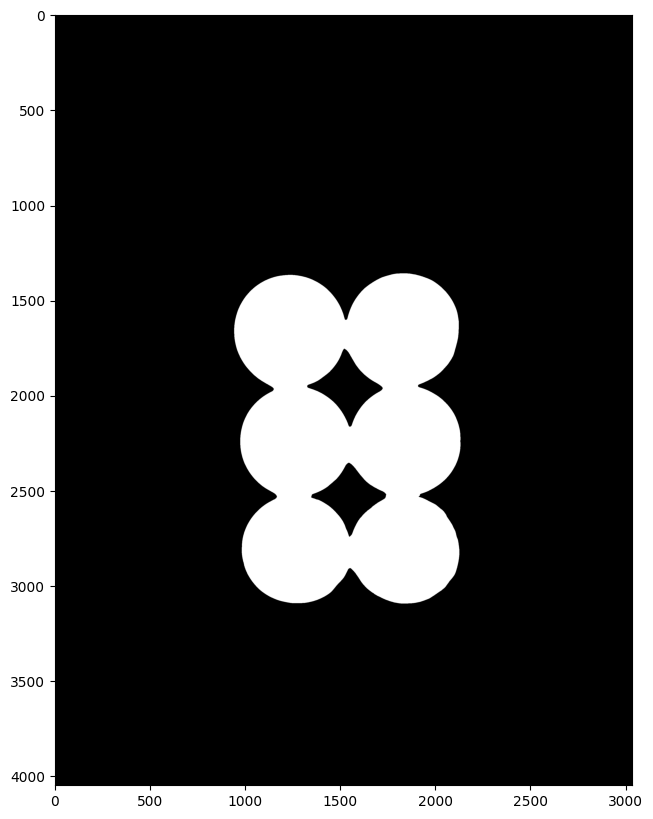

In [80]:
display(sure_bg)

In [81]:
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)

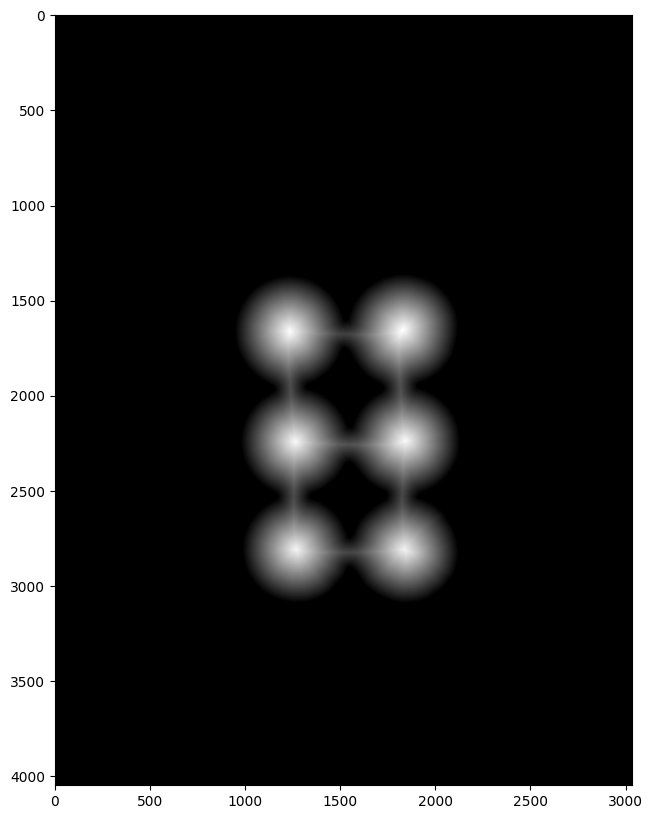

In [82]:
display(dist_transform)

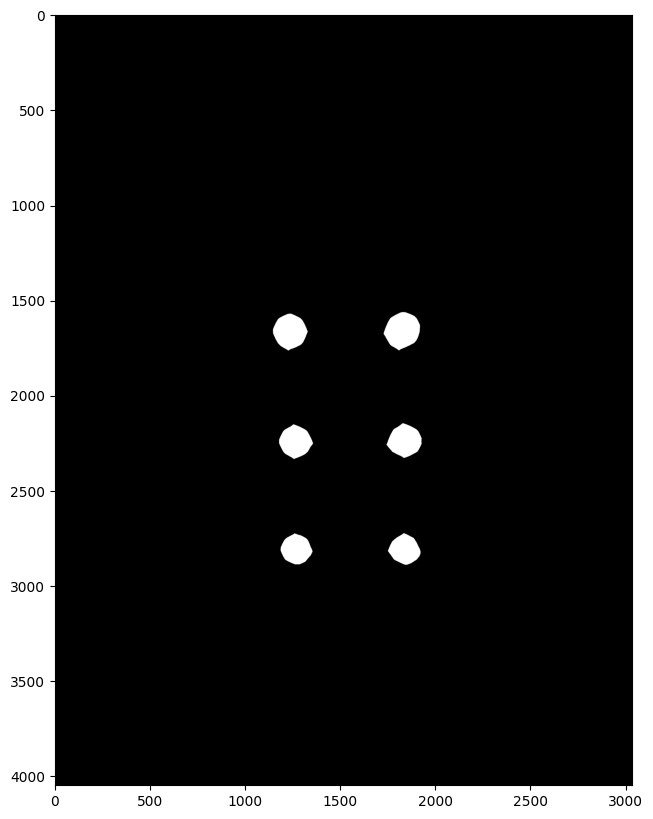

In [83]:
display(sure_fg)

In [84]:
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

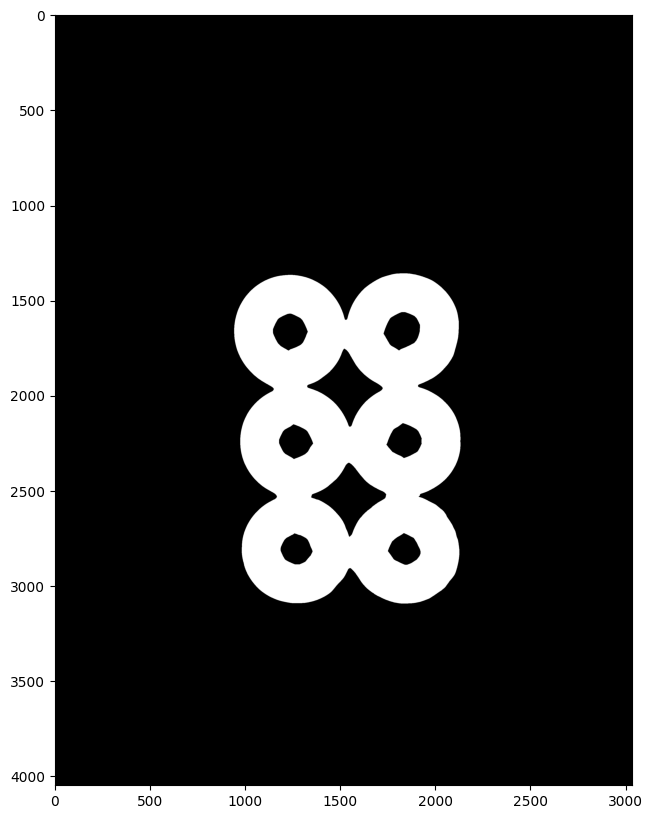

In [85]:
display(unknown)

In [86]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

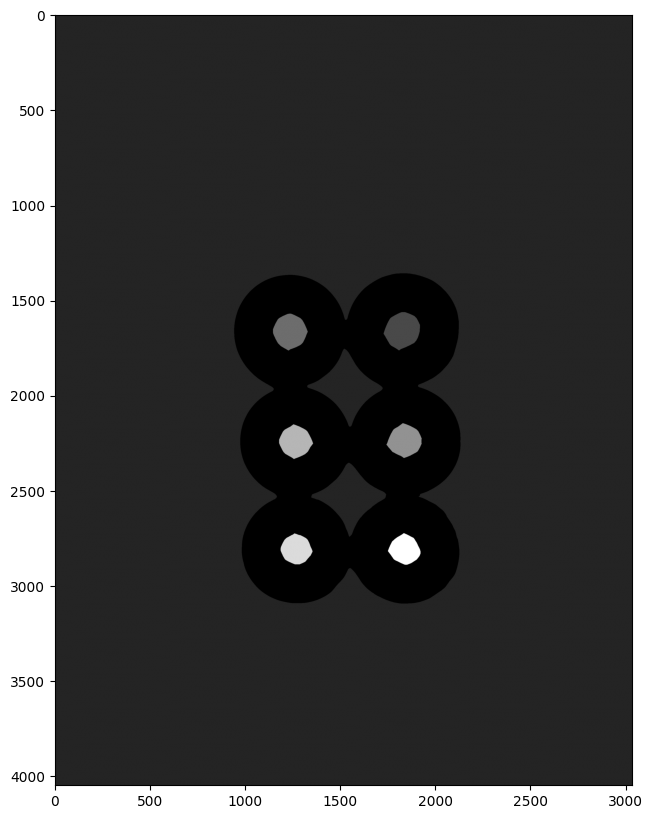

In [87]:
display(markers)

In [88]:
# Apply Watershed Algorithm to find Markers
markers = cv2.watershed(img,markers)

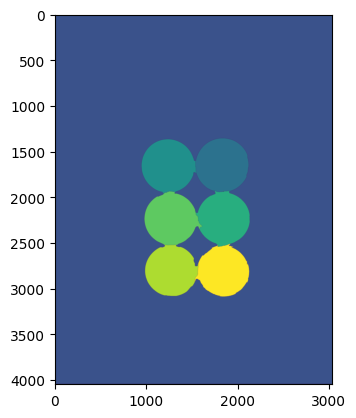

In [89]:
plt.imshow(markers)

In [90]:
# Find Contours on Markers
contours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(sep_coins, contours, i, (255, 0, 0), 10)

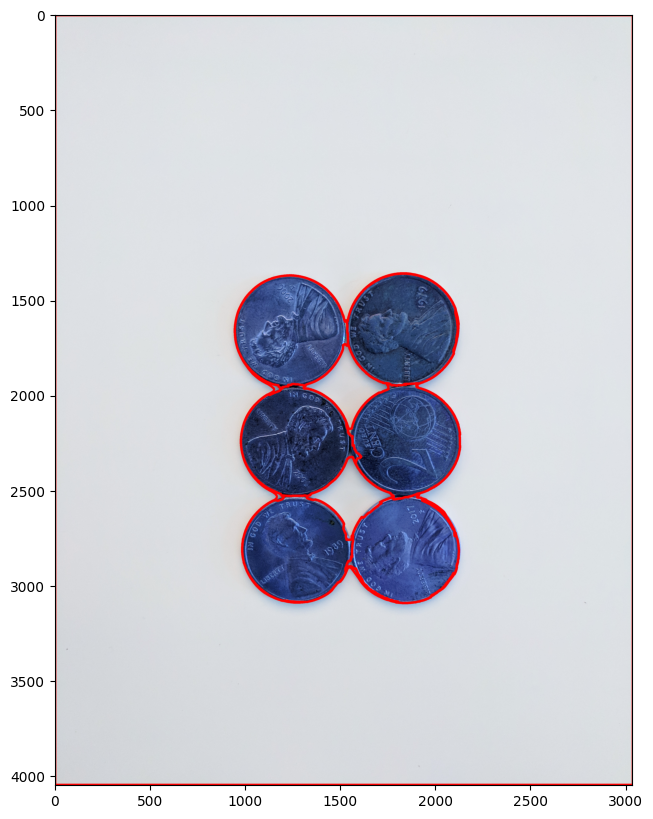

In [91]:
display(sep_coins)

# Custom Seeds with the WaterShed Algorithm

Previously we did a lot of work for OpenCV to set Markers to provide seeds to the Watershed Algorithm. But what if we just provide seeds ourselves? Let's try it out!

In [92]:
road = cv2.imread('road_image.jpg')
road_copy = np.copy(road)

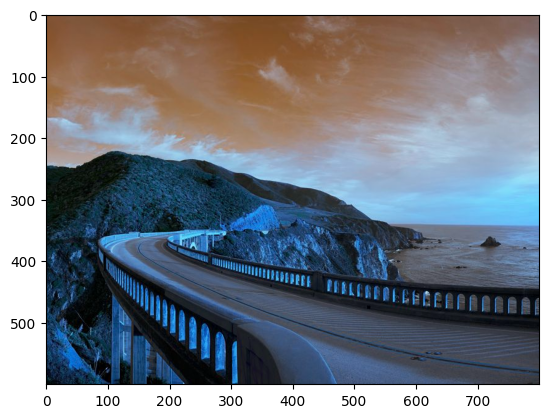

In [93]:
plt.imshow(road)

## Create an empty space for the results to be drawn

In [94]:
road.shape

(600, 800, 3)

In [95]:
road.shape[0:2]

(600, 800)

In [96]:
marker_image = np.zeros(road.shape[:2],dtype=np.int32)

In [97]:
marker_image.shape

(600, 800)

In [98]:
segments = np.zeros(road.shape,dtype=np.uint8)

In [99]:
segments.shape

(600, 800, 3)

## Create colors for Markers

https://matplotlib.org/examples/color/colormaps_reference.html

Returns (R,G,B,Alpha) we only need RGB values

In [101]:
cm.tab10(0)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)

In [102]:
cm.tab10(1)

(1.0, 0.4980392156862745, 0.054901960784313725, 1.0)

In [103]:
np.array(cm.tab10(0))

array([0.12156863, 0.46666667, 0.70588235, 1.        ])

In [104]:
np.array(cm.tab10(0))[:3]

array([0.12156863, 0.46666667, 0.70588235])

In [105]:
np.array(cm.tab10(0))[:3]*255

array([ 31., 119., 180.])

In [106]:
x = np.array(cm.tab10(0))[:3]*255

In [107]:
x.astype(int)

array([ 31, 119, 180])

In [108]:
tuple(x.astype(int))

(31, 119, 180)

Let's make a function for all those steps

In [109]:
def create_rgb(i):
    x = np.array(cm.tab10(i))[:3]*255
    return tuple(x)

In [110]:
colors = []

In [111]:
# One color for each single digit
for i in range(10):
    colors.append(create_rgb(i))

In [112]:
colors

[(31.0, 119.0, 180.0),
 (255.0, 127.0, 14.0),
 (44.0, 160.0, 44.0),
 (214.0, 39.0, 40.0),
 (148.0, 103.0, 189.0),
 (140.0, 86.0, 75.0),
 (227.0, 119.0, 194.0),
 (127.0, 127.0, 127.0),
 (188.0, 189.0, 34.0),
 (23.0, 190.0, 207.0)]

### Setting Up Callback Function

In [114]:
# Numbers 0-9
n_markers = 10
# Default settings
current_marker = 1
marks_updated = False

In [115]:
def mouse_callback(event, x, y, flags, param):
    global marks_updated 

    if event == cv2.EVENT_LBUTTONDOWN:
        
        # TRACKING FOR MARKERS
        cv2.circle(marker_image, (x, y), 10, (current_marker), -1)
        
        # DISPLAY ON USER IMAGE
        cv2.circle(road_copy, (x, y), 10, colors[current_marker], -1)
        marks_updated = True


In [116]:
cv2.namedWindow('Road Image')
cv2.setMouseCallback('Road Image', mouse_callback)

while True:
    
    # SHow the 2 windows
    cv2.imshow('WaterShed Segments', segments)
    cv2.imshow('Road Image', road_copy)
        
        
    # Close everything if Esc is pressed
    k = cv2.waitKey(1)

    if k == 27:
        break
        
    # Clear all colors and start over if 'c' is pressed
    elif k == ord('c'):
        road_copy = road.copy()
        marker_image = np.zeros(road.shape[0:2], dtype=np.int32)
        segments = np.zeros(road.shape,dtype=np.uint8)
        
    # If a number 0-9 is chosen index the color
    elif k > 0 and chr(k).isdigit():
        # chr converts to printable digit
        
        current_marker  = int(chr(k))
        
        # CODE TO CHECK INCASE USER IS CARELESS
#         n = int(chr(k))
#         if 1 <= n <= n_markers:
#             current_marker = n
    
    # If we clicked somewhere, call the watershed algorithm on our chosen markers
    if marks_updated:
        
        marker_image_copy = marker_image.copy()
        cv2.watershed(road, marker_image_copy)
        
        segments = np.zeros(road.shape,dtype=np.uint8)
        
        for color_ind in range(n_markers):
            segments[marker_image_copy == (color_ind)] = colors[color_ind]
        
        marks_updated = False
        
cv2.destroyAllWindows()

# Face Detection with Haar Cascades

**Note: This is face *detection* NOT face *recognition*. We are only detecting if a face is in an image, not who the face actually is. That requires deep learning which we'll go over later!**

In [4]:
nadia = cv2.imread('Nadia_Murad.jpg',0)
denis = cv2.imread('Denis_Mukwege.jpg',0)
solvay = cv2.imread('solvay_conference.jpg',0)

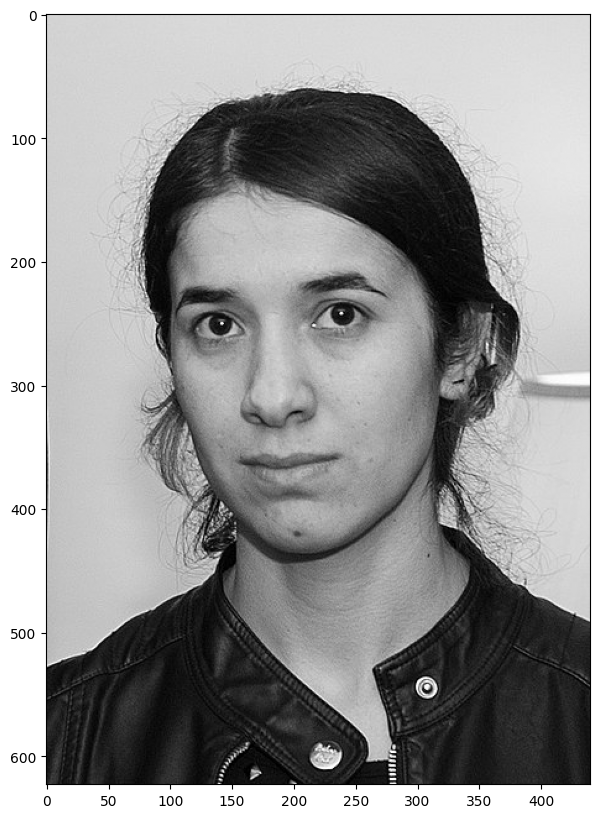

In [5]:
display(nadia)

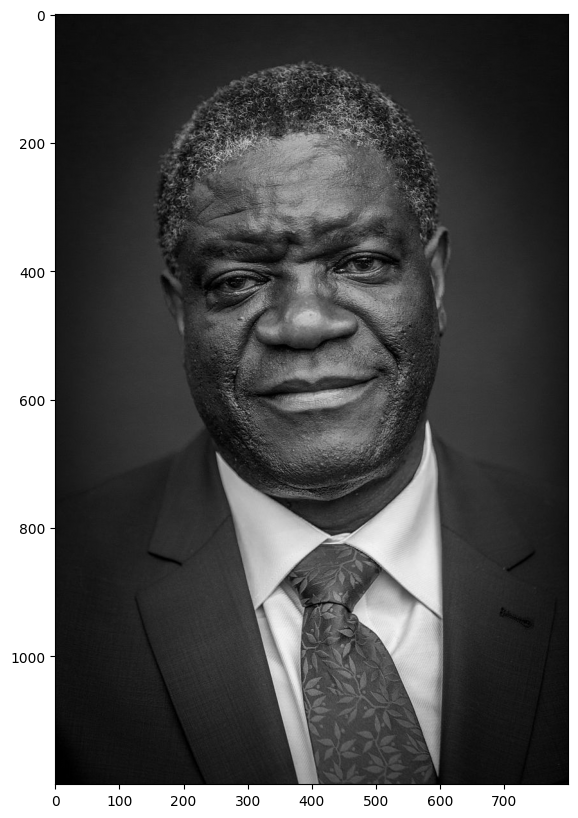

In [6]:
display(denis)

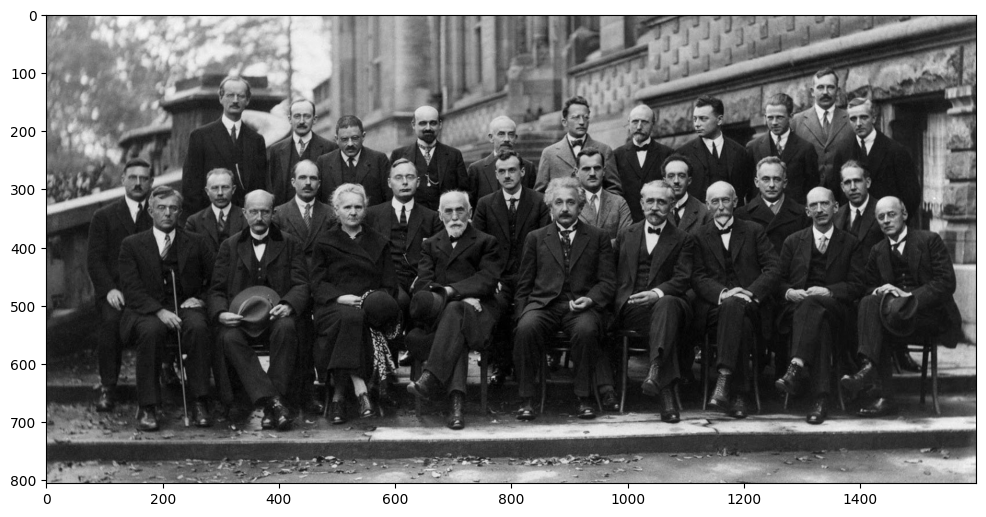

In [7]:
display(solvay)

## Cascade Files

OpenCV comes with these pre-trained cascade files, we've relocated the .xml files for you in our own DATA folder.

In [14]:
## Face Detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [15]:
def detect_face(img):
    
  
    face_img = img.copy()
  
    face_rects = face_cascade.detectMultiScale(face_img) 
    
    for (x,y,w,h) in face_rects: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img

In [18]:
result_denis = detect_face(denis)

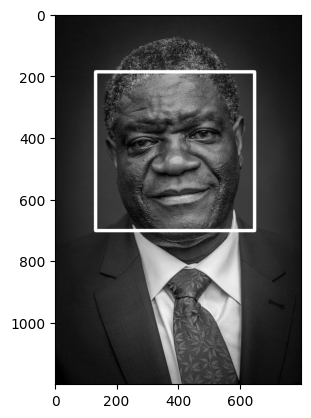

In [20]:
plt.imshow(result_denis,cmap='gray')

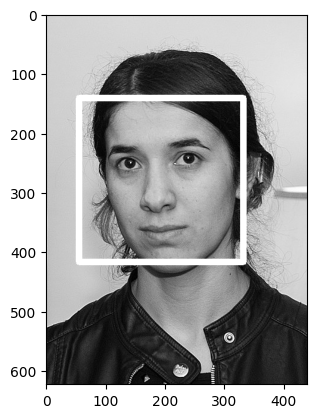

In [21]:
result_nadia = detect_face(nadia)
plt.imshow(result_nadia,cmap='gray')

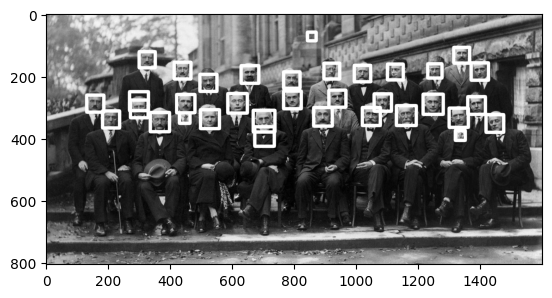

In [22]:
# Gets errors!
result_solvay = detect_face(solvay)
plt.imshow(result_solvay,cmap='gray')

In [35]:
def adj_detect_face(img):
    
    face_img = img.copy()
  
    face_rects = face_cascade.detectMultiScale(face_img,scaleFactor=1.1, minNeighbors=5) 
    
    for (x,y,w,h) in face_rects: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img

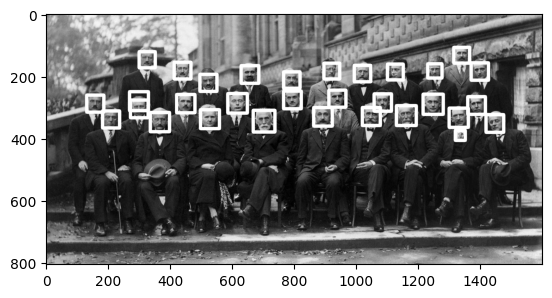

In [36]:
# correct photo detection
result_solvay = adj_detect_face(solvay)
plt.imshow(result_solvay,cmap='gray')

## Eye Cascade File

In [37]:
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

In [38]:
def detect_eyes(img):
    
    face_img = img.copy()
  
    eyes = eye_cascade.detectMultiScale(face_img) 
    
    
    for (x,y,w,h) in eyes: 
        cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255), 10) 
        
    return face_img
    

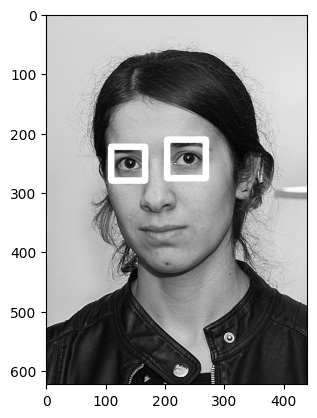

In [39]:
result_nadia = detect_eyes(nadia)
plt.imshow(result_nadia,cmap='gray')

## Conjunction with Video

In [40]:
cap = cv2.VideoCapture(0) 

while True: 
    
    ret, frame = cap.read(0) 
     
    frame = detect_face(frame)
 
    cv2.imshow('Video Face Detection', frame) 
 
    c = cv2.waitKey(1) 
    if c == 27: 
        break 
        
cap.release() 
cv2.destroyAllWindows()